<a href="https://colab.research.google.com/github/yule0707/Lajittelija/blob/main/Luokittelu_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLO Object Detection

Tässä harjoituksessa:

1. Käytät esiopetettua YOLO-mallia (COCO)
2. Fine-tunetat mallin uudelle avoimelle datasetille
3. Arvioit mallin suorituskykyä ja teet virheanalyysin

## Oppimistavoite

Harjoituksen jälkeen osaat:
- Ajaa object detection -mallin inferenssin
- Tulkitse confidence- ja IoU-parametreja
- Kouluttaa YOLO-mallin uudelle datasetille
- Arvioida mallin onnistumista kriittisesti

---

## Työskentelytapa

- Suorita solut järjestyksessä
- Vastaa pohdintakysymyksiin Markdown-soluissa
- Tallenna lopuksi valmis notebook palautusta varten


# GPU käyttöön Google Colabissa

YOLO-mallin koulutus on huomattavasti nopeampaa GPU:lla.  
Varmista ennen trainingin aloittamista, että GPU on käytössä.

## Ota GPU käyttöön

1. Valitse ylävalikosta **Runtime**
2. Klikkaa **Change runtime type**
3. Valitse kohdasta **Hardware accelerator → GPU**
4. Paina **Save**

---

## Tarkista, että GPU on käytössä

Aja seuraava solu:



In [1]:
!nvidia-smi

Wed Feb 25 10:18:41 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   64C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
# ============================================================
# 0) Setup
# ============================================================
!pip -q install ultralytics

import os, glob, random
from pathlib import Path
from ultralytics import YOLO


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 38.2 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# Vaihe 1 – Esiopetetun mallin käyttö

Tässä vaiheessa käytämme valmista YOLO-mallia, joka on koulutettu COCO-datasetillä.

## Mitä tämä tarkoittaa?

- Malli tunnistaa 80 yleistä objektia
- Et kouluta mallia vielä
- Testaat valmista mallia omilla kuvilla

---

## Ennen kuin ajat koodin:

Pohdi:

1. Mitä objekteja odotat mallin tunnistavan?
2. Mitä tapahtuu, jos kuvassa on objekti, jota COCO ei sisällä?
3. Mitä confidence-arvo kuvaa?

Kirjoita lyhyet vastaukset alle.


1. Reunoja, muotoja ja pintoja.
2. Malli ei tunnista objektia, ellei sitä on Finetuunattu.
3. Varummuuta, että Bounding box sisältää tietyn objektin

In [5]:
# ============================================================
# 1) Load a pretrained YOLO model (COCO)
#    - "yolov8n.pt"
# ============================================================

model = YOLO("yolov8n.pt")


### Kokeillaan itse ladatulla kuvalla

- Lataa internetistä kuva tai ota itse kuva ja kokeile.
- Mielenkiintoisinta on, jos kuvassa on monta erilaista asiaa tai esinettä (esim. kuva tavaroista pöydällä tai vilkkaasta kadusta.)

In [6]:
# ============================================================
# 2) Inference on example images (Ultralytics provides sample assets sometimes,
#    but we'll fetch a couple of public images via ultralytics' built-in demo approach:
#    - simplest: run on a URL or local file you upload.
# ============================================================

# Option A: Upload your own image(s) in Colab:
from google.colab import files
uploaded = files.upload()  # upload e.g. street.jpg

img_paths = list(uploaded.keys())
print("Uploaded:", img_paths)

results = model.predict(source=img_paths, conf=0.5)


Saving juhos_desk.jpg to juhos_desk.jpg
Uploaded: ['juhos_desk.jpg']

0: 640x480 1 person, 1 cup, 1 tv, 1 mouse, 1 keyboard, 85.1ms
Speed: 25.3ms preprocess, 85.1ms inference, 41.0ms postprocess per image at shape (1, 3, 640, 480)


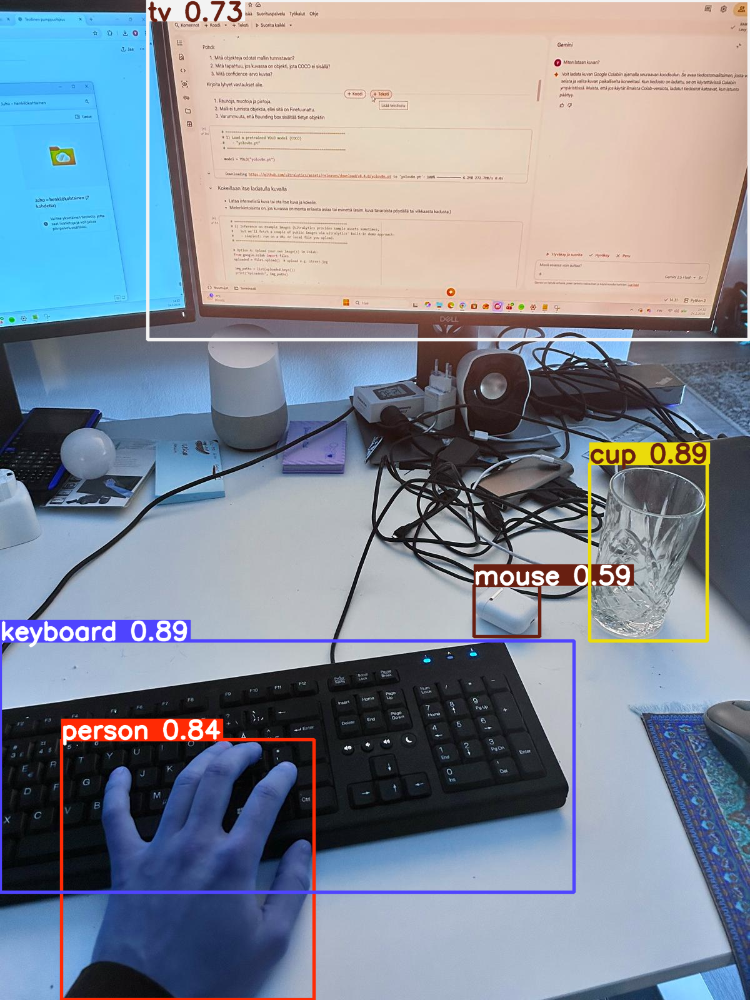

In [7]:
# Show saved predictions (Ultralytics saves under runs/ by default)
import matplotlib.pyplot as plt
from PIL import Image

for r in results:
    im_array = r.plot()  # piirtää bboxit
    display(Image.fromarray(im_array))


# ✏ Tehtävä: Vaihda conf=0.25 suuremmaksi ja vertaa, mitä laatikoita katoaa/miksi.

## Confidence-rajan vaikutus

Olet nyt kokeillut eri `conf`-arvoja.

Pohdi:

1. Mitä tapahtui, kun confidencea nostettiin?
2. Vähenikö false positive -havaintoja?
3. Näitkö tilanteita, joissa oikea objekti katosi liian korkean rajan vuoksi?

Yhdistä havaintosi precision–recall -käsitteisiin.


1. Osa tunnistetuista objekteista hylättiin.
2. Kyllä, väheni.
3. Kyllä.

Korkea precision, matala recall. Selkeät objektit löydettiin. Jos objekti näkui osittais confidence laski. Epämääräisiä objekteja ei tunnistettu.




# Vaihe 2 – Mallin uudelleenkoulutus (Fine-tuning)

Nyt siirrytään valmiin mallin käytöstä mallin kouluttamiseen.

Tavoite:
- Opettaa YOLO tunnistamaan Aquarium-datasetin luokat
- Arvioida mallin suorituskykyä
- Verrata tuloksia Vaiheen 1 kokemukseen

---

## Ennakkoajattelu - Pohdittavaksi

1. Miksi emme kouluta mallia täysin alusta?
2. Miksi pretrained-malli todennäköisesti oppii nopeammin?
3. Mitä riskejä pienessä datasetissä on?


In [8]:
# ============================================================
# 3) Download dataset (GitHub repo contains a 'dataset' folder)
# ============================================================
!git clone -q https://github.com/SIRIUS-webkit/aquarium_object_detection.git

# Inspect
!ls -lah aquarium_object_detection
!ls -lah aquarium_object_detection/dataset | head


total 912K
drwxr-xr-x 5 root root 4.0K Feb 25 10:20 .
drwxr-xr-x 1 root root 4.0K Feb 25 10:20 ..
drwxr-xr-x 2 root root 4.0K Feb 25 10:20 assets
-rw-r--r-- 1 root root  150 Feb 25 10:20 custom_data.yaml
-rw-r--r-- 1 root root 881K Feb 25 10:20 custom_training.ipynb
drwxr-xr-x 4 root root 4.0K Feb 25 10:20 dataset
drwxr-xr-x 8 root root 4.0K Feb 25 10:20 .git
-rw-r--r-- 1 root root 3.1K Feb 25 10:20 README.md
total 16K
drwxr-xr-x 4 root root 4.0K Feb 25 10:20 .
drwxr-xr-x 5 root root 4.0K Feb 25 10:20 ..
drwxr-xr-x 4 root root 4.0K Feb 25 10:20 images
drwxr-xr-x 4 root root 4.0K Feb 25 10:20 labels


In [9]:
from pathlib import Path

dataset_root = Path("aquarium_object_detection/dataset")

yaml_text = f"""
path: {dataset_root.resolve()}
train: images/train
val: images/val

names:
  0: fish
  1: jellyfish
  2: penguin
  3: puffin
  4: shark
  5: starfish
  6: stingray
""".strip()

Path("aquarium_data.yaml").write_text(yaml_text, encoding="utf-8")
print(yaml_text)


path: /content/aquarium_object_detection/dataset
train: images/train
val: images/val

names:
  0: fish
  1: jellyfish
  2: penguin
  3: puffin
  4: shark
  5: starfish
  6: stingray


In [10]:
import glob
from pathlib import Path

root = Path("aquarium_object_detection/dataset")
imgs = [Path(p) for p in glob.glob(str(root/"images/train/*"))]
lbl_dir = root/"labels/train"

missing = 0
for p in imgs[:50]:
    lbl = lbl_dir/(p.stem + ".txt")
    if not lbl.exists():
        missing += 1

print("Checked:", min(50, len(imgs)), "Missing labels:", missing)



Checked: 50 Missing labels: 0


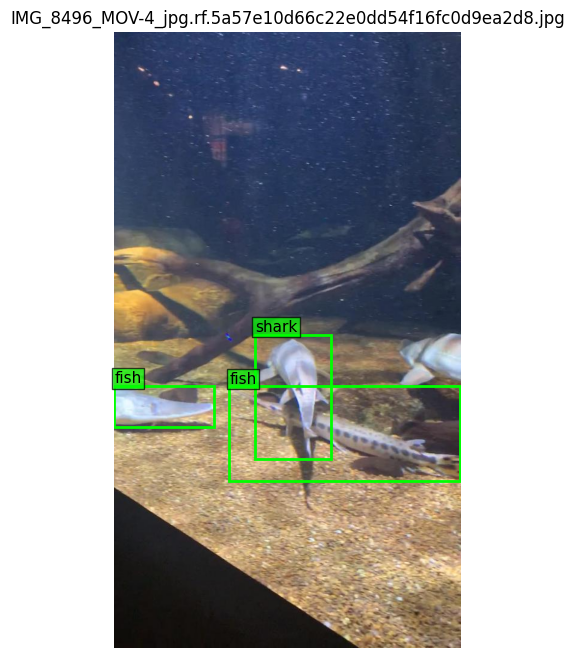

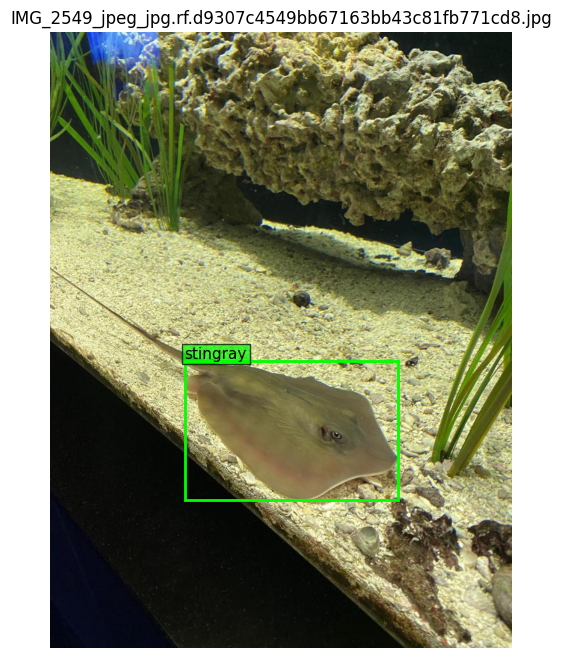

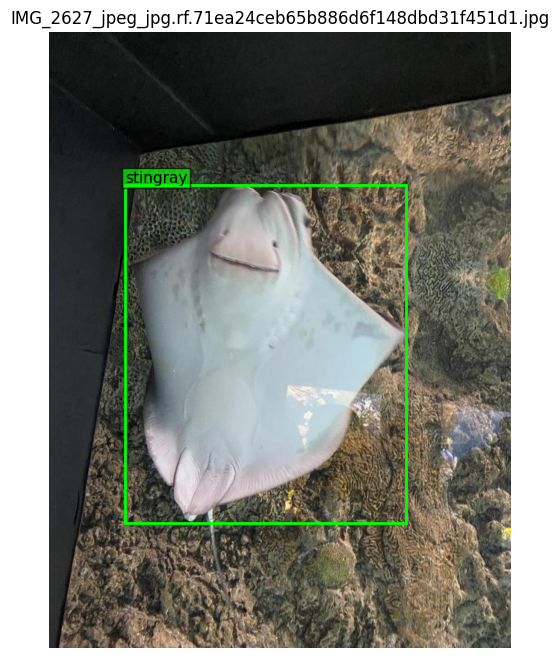

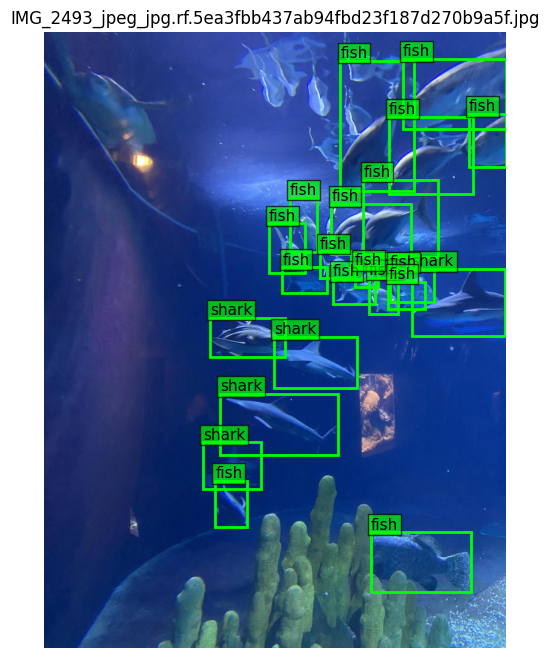

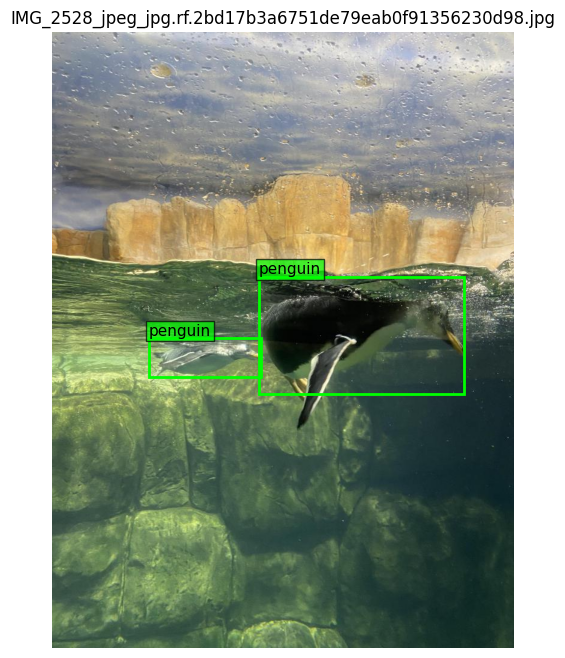

In [11]:
# ============================================================
# Visualize dataset images WITH ground truth bounding boxes
# ============================================================

from pathlib import Path
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Paths (teidän rakenne)
root = Path("aquarium_object_detection/dataset")
img_dir = root / "images/train"
lbl_dir = root / "labels/train"

class_names = [
    "fish",
    "jellyfish",
    "penguin",
    "puffin",
    "shark",
    "starfish",
    "stingray"
]

# Valitse satunnaiset kuvat
imgs = random.sample(list(img_dir.glob("*.*")), k=5)

for img_path in imgs:
    label_path = lbl_dir / (img_path.stem + ".txt")

    img = Image.open(img_path).convert("RGB")
    W, H = img.size

    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img)

    if label_path.exists():
        lines = label_path.read_text().strip().splitlines()

        for line in lines:
            class_id, xc, yc, w, h = map(float, line.split())

            # YOLO normalized -> pixel coordinates
            xc *= W
            yc *= H
            w *= W
            h *= H

            x_min = xc - w / 2
            y_min = yc - h / 2

            rect = patches.Rectangle(
                (x_min, y_min),
                w,
                h,
                linewidth=2,
                edgecolor="lime",
                facecolor="none"
            )
            ax.add_patch(rect)

            ax.text(
                x_min,
                max(0, y_min - 5),
                class_names[int(class_id)],
                color="black",
                fontsize=11,
                bbox=dict(facecolor="lime", alpha=0.7, pad=2)
            )
    else:
        print("Label missing for:", img_path.name)

    ax.set_title(img_path.name)
    ax.axis("off")
    plt.show()


## Datasetin analyysi

Tarkastelit kuvia ja label-tiedostoja.

Vastaa:

1. Kuinka monta luokkaa datasetissä on?
2. Ovatko kaikki luokat yhtä yleisiä?
3. Näkyykö kuvissa haasteita (valaistus, peittyminen, pieni koko)?

Miten nämä voivat vaikuttaa mallin oppimiseen?


1. 7 luokkaa
2. Luokka "fish" on yleinen, muuten hyvin yksiselitteisiä.
3. Hämärä valo, liikkuvat objektit, sekoittuva tausta, pieni koko.

Malli oppii hitaammin, koska precision täytyy olla tarkka.

### Mallin opettaminen

Seuraavaksi malli opetetaan.

Tässä vaiheessa valitaan seuraavat parametrit
- Epochs eli kuinka monta kertaa koko data ajetaan mallin läpi. Suurempi määrä parantaa mallin tarkkuutta, mutta vie resursseja
- imgsz eli kuvakoko. Iso kuvakoko hidastaa opetusta, mutta liian pieni kuvakoko heikentää mallin kykyä tunnistaa kappaleet
- batch eli eräkoko. Parametri määrittää kuinka isoissa erissä kuvia syötetään mallille. Eräkoon tulisi olla suurempi kuin luokkien määrä, jotta jokaisessa erässä olisi varmasti kaikkien luokkien kuvia edustettuina

# ⚠ SEURAAVAN SOLUN SUORITUS KESTÄÄ PITKÄÄN

- Varmista, että sinulla on GPU käytössäsi
- Jos et saa GPU:ta käyttöön, kokeile pienemmällä epoch -määrällä (10) ja pienemmällä kuvakoolla (320). Vaihtoehtoisesti voit yrittää myöhemmin uudestaan.

In [12]:
# ============================================================
# 7) Train (fine-tune) starting from pretrained weights
#    Pidä treeni kevyenä Colabissa: esim 20 epoch, imgsz 640, pieni malli.
# ============================================================
from ultralytics import YOLO
model = YOLO("yolov8n.pt")
model.train(data="aquarium_data.yaml", epochs=20, imgsz=640, batch=16)


Ultralytics 8.4.16 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=aquarium_data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b4ce22d63f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

### Tutkitaan tuloksia

Using weights: runs/detect/train/weights/best.pt
Ultralytics 8.4.16 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1903.4±617.2 MB/s, size: 82.7 KB)
val: Scanning /content/aquarium_object_detection/dataset/labels/val.cache... 127 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 127/127 6.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 2.0it/s 3.9s
                   all        127        909      0.765       0.65      0.728      0.441
                  fish         63        459      0.839      0.667      0.766      0.436
             jellyfish          9        155       0.76      0.865      0.881      0.497
               penguin         17        104      0.663      0.605      0.675       0.32
                puffin         15         74      0.734      0.448  

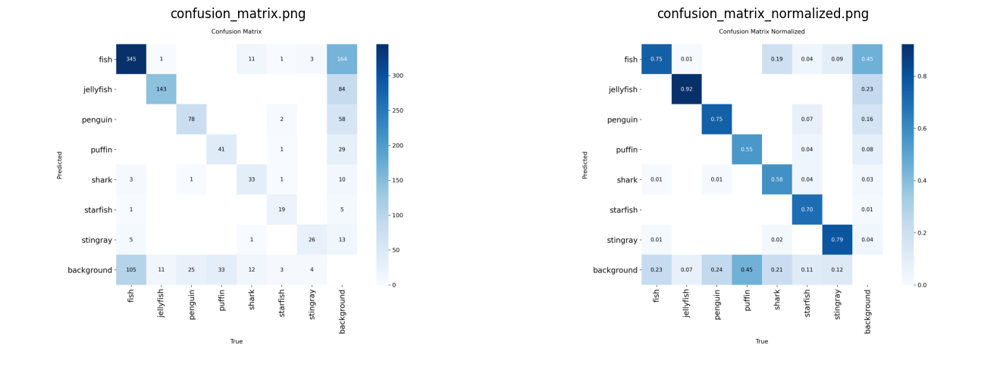

In [13]:
# ============================================================
# Fancy validation visualization (metrics + curves + confusion matrix)
# ============================================================

from ultralytics import YOLO
from pathlib import Path
from glob import glob
import matplotlib.pyplot as plt
from PIL import Image
import os

# 1) Load best weights robustly
best_weights = sorted(glob("runs/detect/train*/weights/best.pt"))[-1]
print("Using weights:", best_weights)
model_ft = YOLO(best_weights)

# 2) Run validation with plots enabled
metrics = model_ft.val(
    data="aquarium_data.yaml",
    split="val",
    plots=True  # tells Ultralytics to save PR/F1/confusion matrix etc.
)

# 3) Locate validation output directory
# Newer Ultralytics: metrics.save_dir exists; fallback: find latest runs/detect/val*
save_dir = getattr(metrics, "save_dir", None)
if save_dir is None:
    val_dirs = sorted(glob("runs/detect/val*"), key=os.path.getmtime)
    save_dir = val_dirs[-1] if val_dirs else None

save_dir = Path(save_dir)
print("Validation artifacts in:", save_dir.resolve())

# 4) Print key scalars (robust)
def safe_get(obj, attr, default=None):
    return getattr(obj, attr, default)

box = safe_get(metrics, "box", None)

print("\n--- Key metrics ---")
if box is not None:
    # Typical Ultralytics box metrics
    print("Precision (P):", safe_get(box, "mp", "N/A"))
    print("Recall (R):", safe_get(box, "mr", "N/A"))
    print("mAP@0.50:", safe_get(box, "map50", "N/A"))
    print("mAP@0.50:0.95:", safe_get(box, "map", "N/A"))
else:
    print(metrics)

# 5) Display saved plots nicely (if present)
plot_candidates = [
    "confusion_matrix.png",
    "confusion_matrix_normalized.png",
    "PR_curve.png",
    "F1_curve.png",
    "P_curve.png",
    "R_curve.png",
    "labels.jpg",
    "labels_correlogram.jpg",
]

existing = [save_dir/p for p in plot_candidates if (save_dir/p).exists()]
print("\nFound plots:", [p.name for p in existing])

if not existing:
    print("No plots found. If this happens, ensure `plots=True` and Ultralytics version supports saving plots.")
else:
    # Create a clean gallery
    n = len(existing)
    cols = 2
    rows = (n + cols - 1) // cols

    plt.figure(figsize=(14, 5 * rows))
    for i, p in enumerate(existing, 1):
        img = Image.open(p)
        ax = plt.subplot(rows, cols, i)
        ax.imshow(img)
        ax.set_title(p.name, fontsize=12)
        ax.axis("off")
    plt.tight_layout()
    plt.show()


# Mallin suorituskyky

Tarkastele:
- Mitä luokkia malli oppi tunnistamaan parhaiten?
- Mitä heikoiten?



Using weights: runs/detect/train/weights/best.pt

0: 640x480 28 fishs, 1 shark, 5 stingrays, 6.8ms
1: 640x480 6 jellyfishs, 6.8ms
2: 640x480 3 penguins, 6.8ms
3: 640x480 3 fishs, 1 shark, 6.8ms
4: 640x480 1 fish, 2 sharks, 3 starfishs, 6.8ms
5: 640x480 1 fish, 1 shark, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


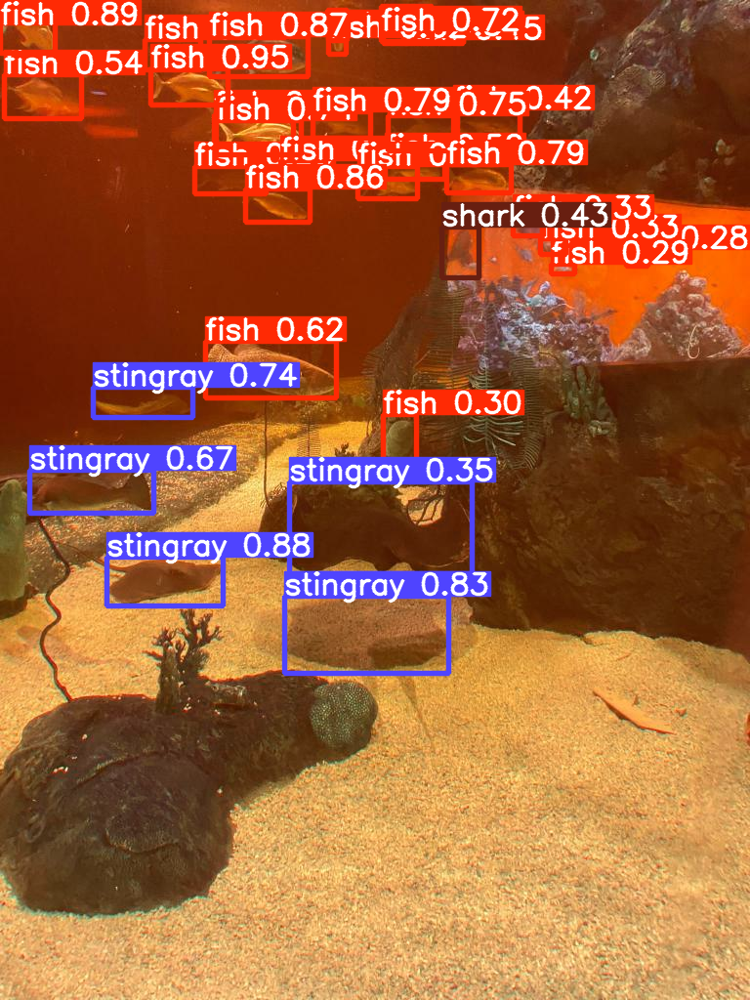

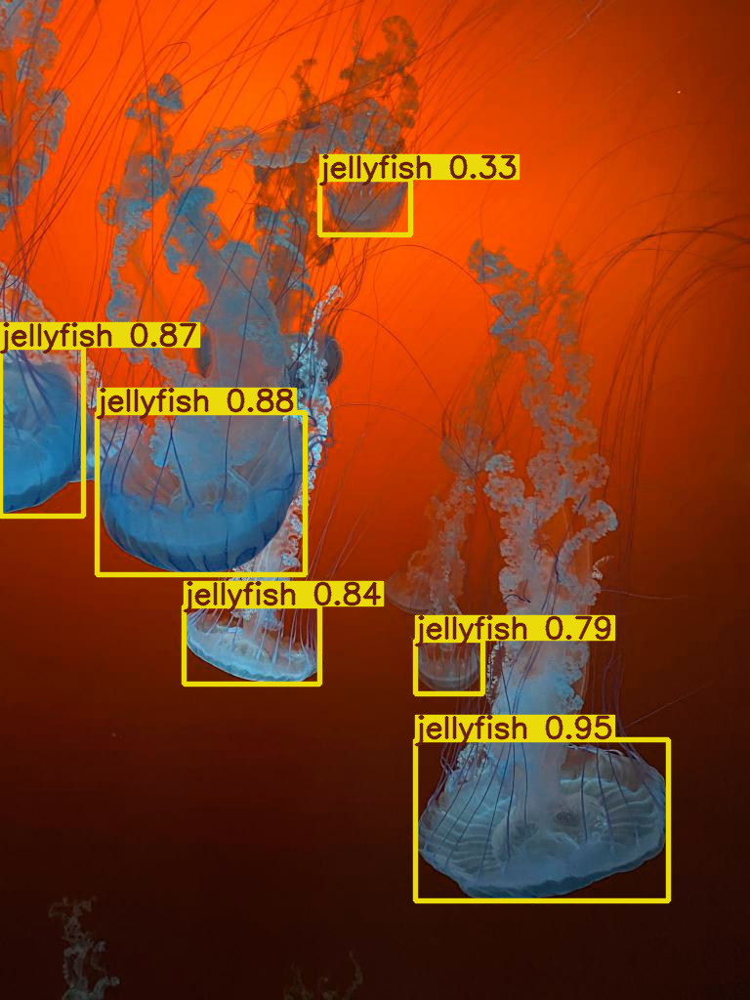

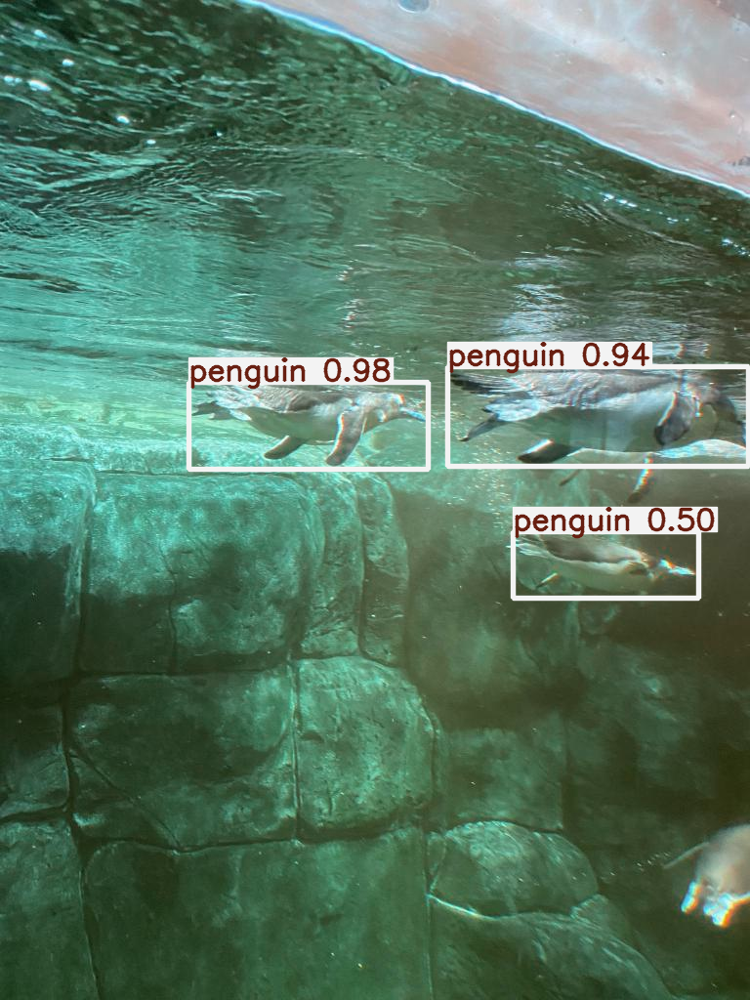

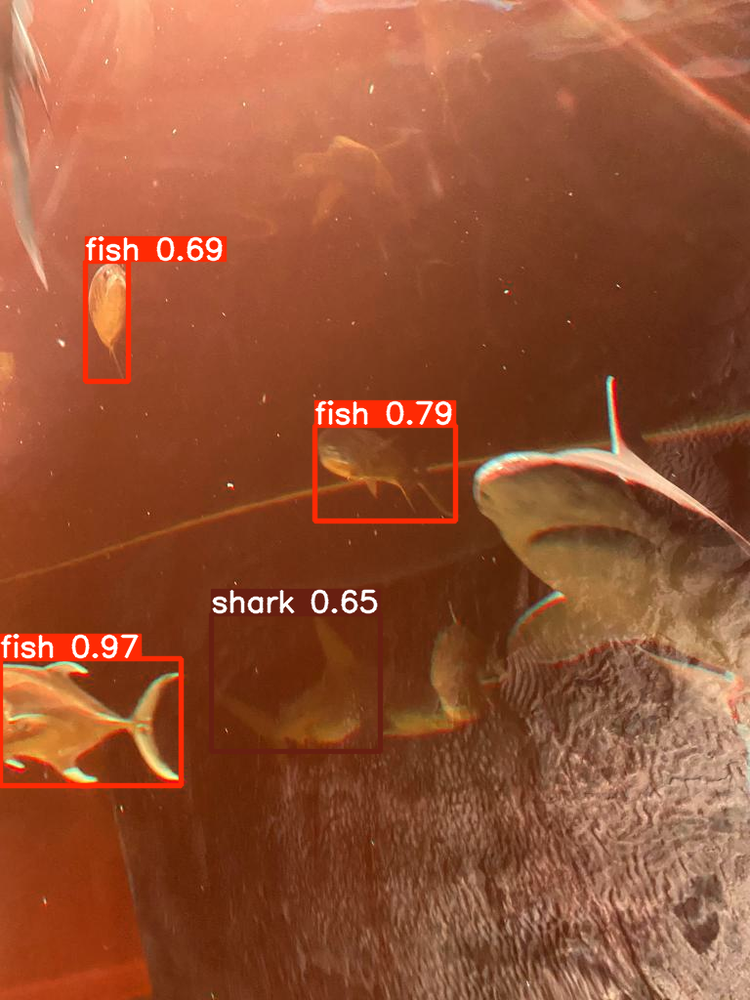

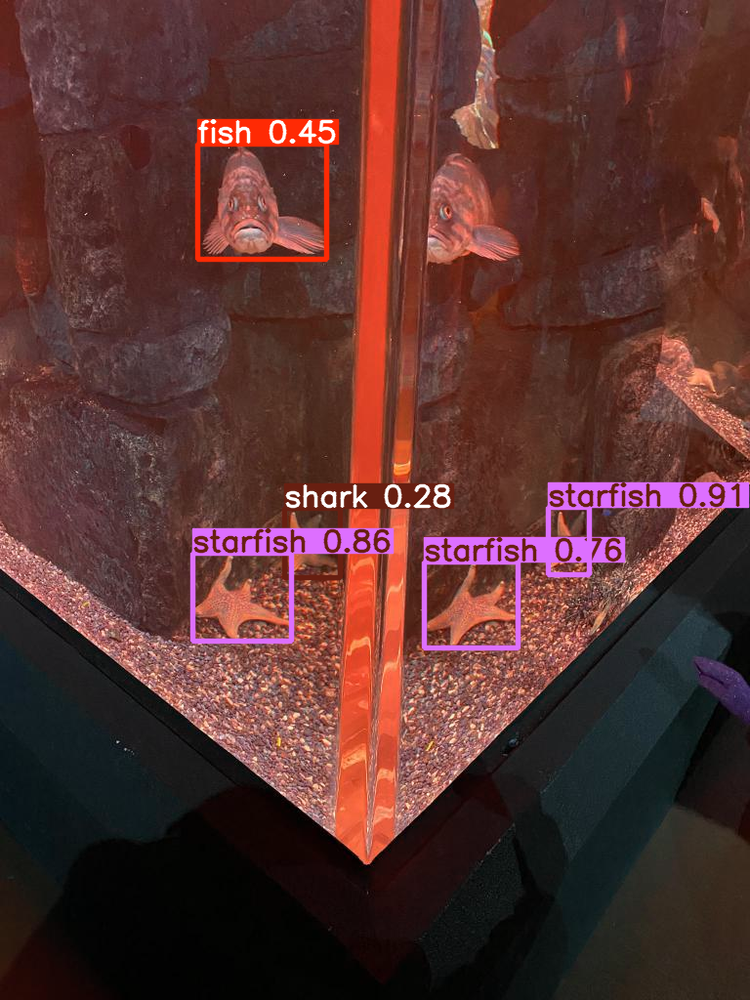

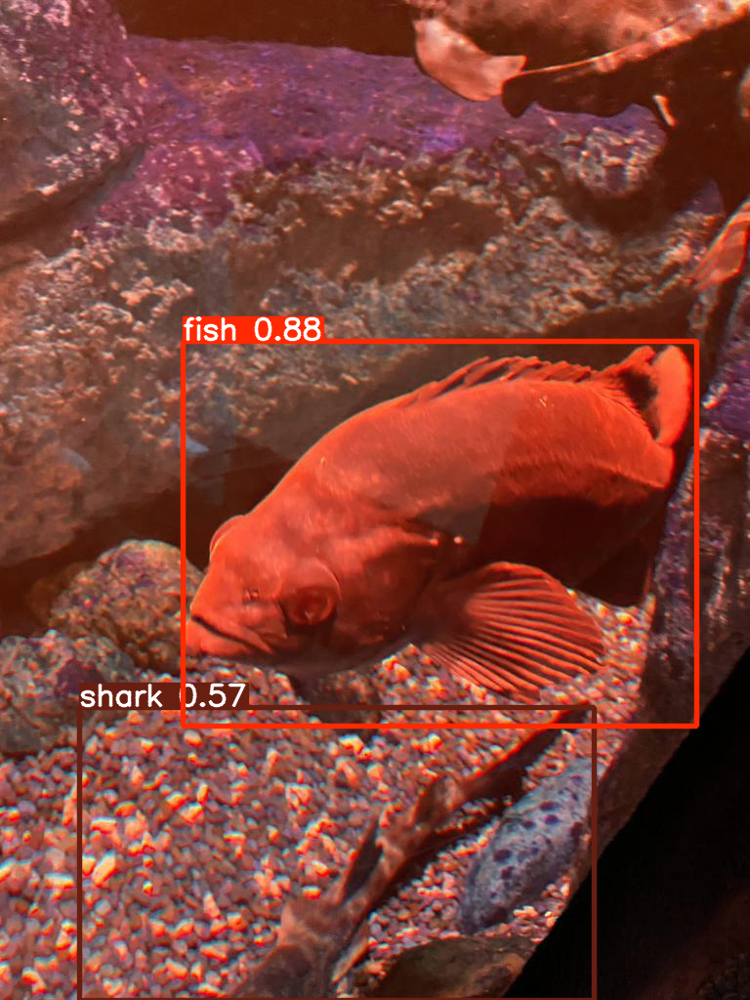

In [14]:
# ============================================================
# 9) Predict on a few VAL images and visualize (no test split here)
#    - Uses results object (no dependency on runs/ folder)
# ============================================================

import random
from pathlib import Path
from PIL import Image

# After training, load the best weights explicitly (robust)
# Ultralytics saves weights under: runs/detect/train*/weights/best.pt
# model = YOLO("runs/detect/train/weights/best.pt")  # sometimes train, train2, ...
# Instead, find latest best.pt:
from glob import glob
best_weights = sorted(glob("runs/detect/train*/weights/best.pt"))[-1]
print("Using weights:", best_weights)

from ultralytics import YOLO
model_ft = YOLO(best_weights)

root = Path("aquarium_object_detection/dataset")
val_imgs = list((root / "images/val").glob("*.*"))
sample = random.sample(val_imgs, k=min(6, len(val_imgs)))

results = model_ft.predict(source=[str(p) for p in sample], conf=0.25)

for r in results:
    im = r.plot()  # numpy array with boxes drawn
    display(Image.fromarray(im))


# Tallenna työkirjasi ja palauta OMA:an

1. Valitse **File**
2. Klikkaa **Download → Download .ipynb**
3. Tallenna tiedosto omalle koneellesi

Tämä versio palautetaan OMA:an

## Ennen palautusta tarkista:

- Kaikki solut on ajettu ilman virheitä
- Kuvalliset tulokset (bbox-visualisoinnit) näkyvät notebookissa

---

## Tärkeää

Jos käytät Colab Free -versiota:
- Runtime voi katketa
- Tallentamattomat tulokset (esim. runs-kansiot) katoavat

Siksi:
- Tallenna notebook ajoittain
- Älä jätä koulutusta käyntiin ilman valvontaa
